In [64]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Read the image as Grayscale

First we read the input image as grayscale. In order to represent it, we will use matplotlib, which allows us to include it in the jupyter notebook, without the need to pop up an image that the OpenCV function imshow requires.

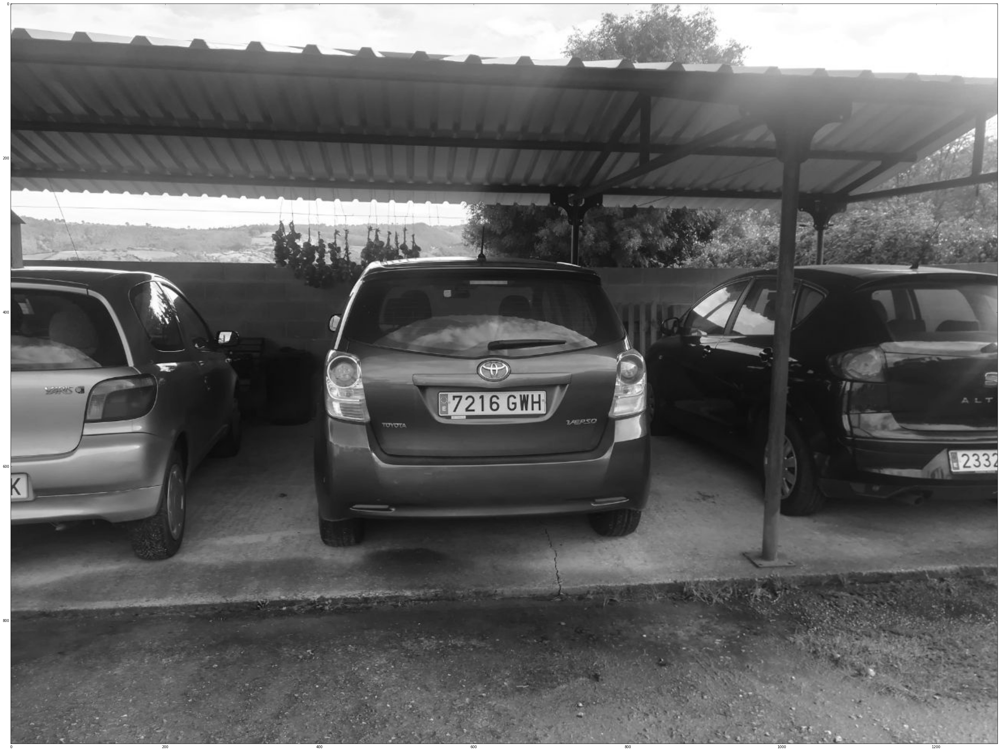

In [65]:
## Read the image from file in grayscale
img = cv2.imread('coche.jpg',0)
# Matplotlib necesita que le indiquen que la imagen es en niveles de gris
plt.imshow(img, cmap='gray')
plt.show()

# Plotting Histogram

## Using matplotlib

First, matplotlib

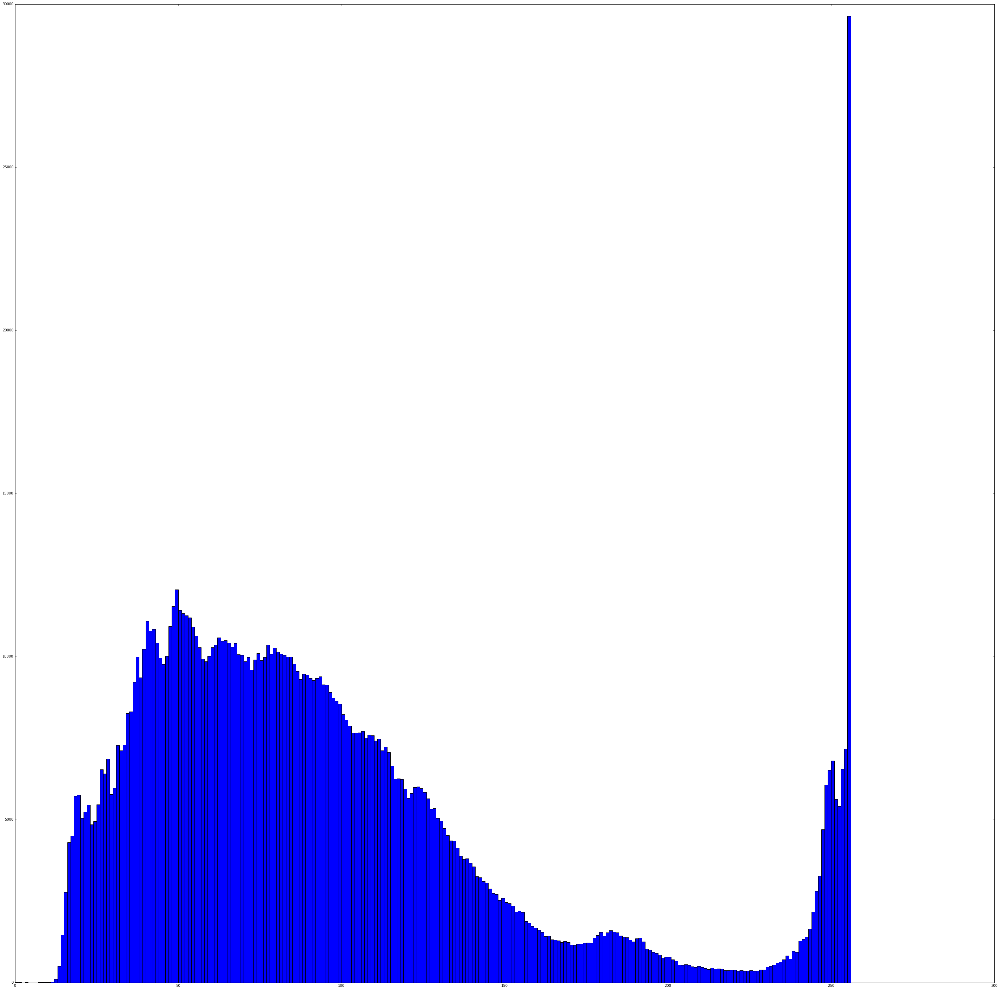

In [66]:
plt.hist(img.ravel(),256,[0,256]); plt.show()

# Using OpenCV

## Aplication of a mask: find Histogram of a specific area

In this case, I know that some areas of the image will never have the registration plate.

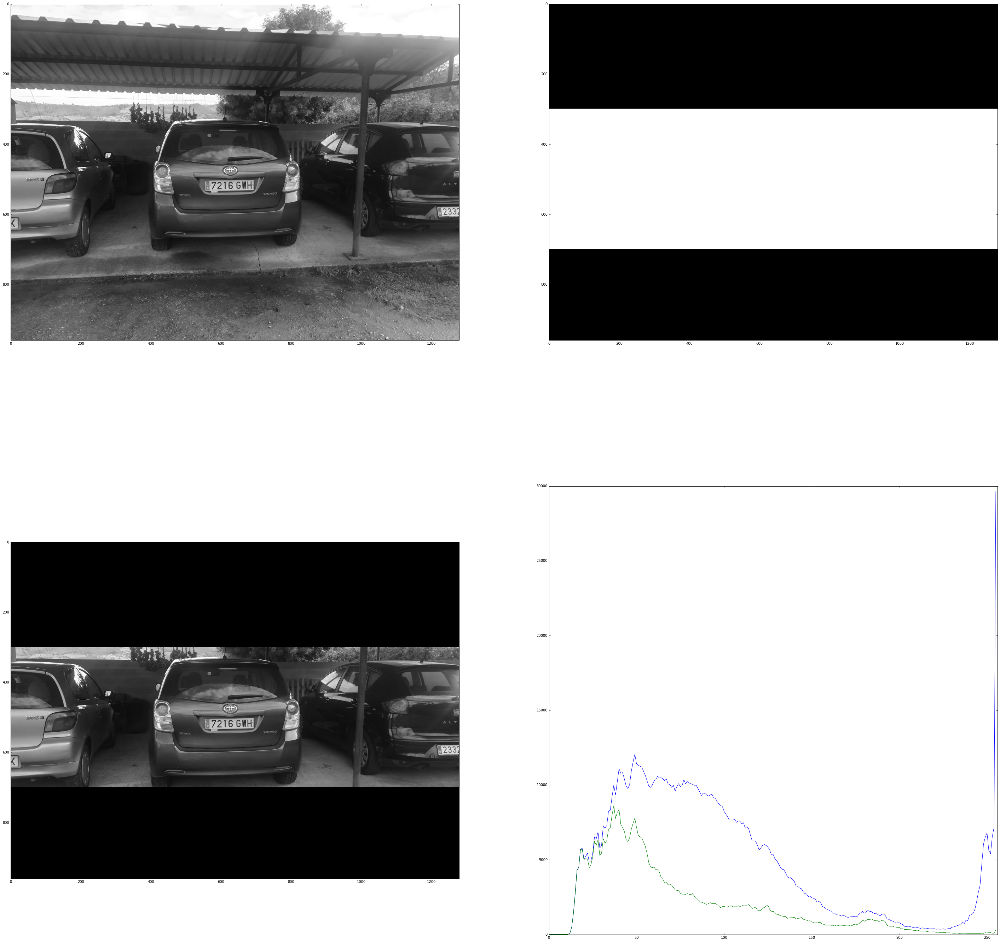

In [67]:
mask = np.zeros(img.shape[:2], np.uint8)
mask[300:700, :] = 255
# Apply mask
masked_img = cv2.bitwise_and(img,img,mask = mask)
# Obtain histogram
hist_full = cv2.calcHist([img],[0],None,[256],[0,256])
hist_mask = cv2.calcHist([img],[0],mask,[256],[0,256])

plt.subplot(221), plt.imshow(img, 'gray')
plt.subplot(222), plt.imshow(mask,'gray')
plt.subplot(223), plt.imshow(masked_img, 'gray')
plt.subplot(224), plt.plot(hist_full), plt.plot(hist_mask)
plt.xlim([0,256])

plt.show()
# Blue line  -> full image
# Green line -> Masked image

# Image Thresholding

## Simple thresholding

First let's do a simple thresholding to see if it is fair enough

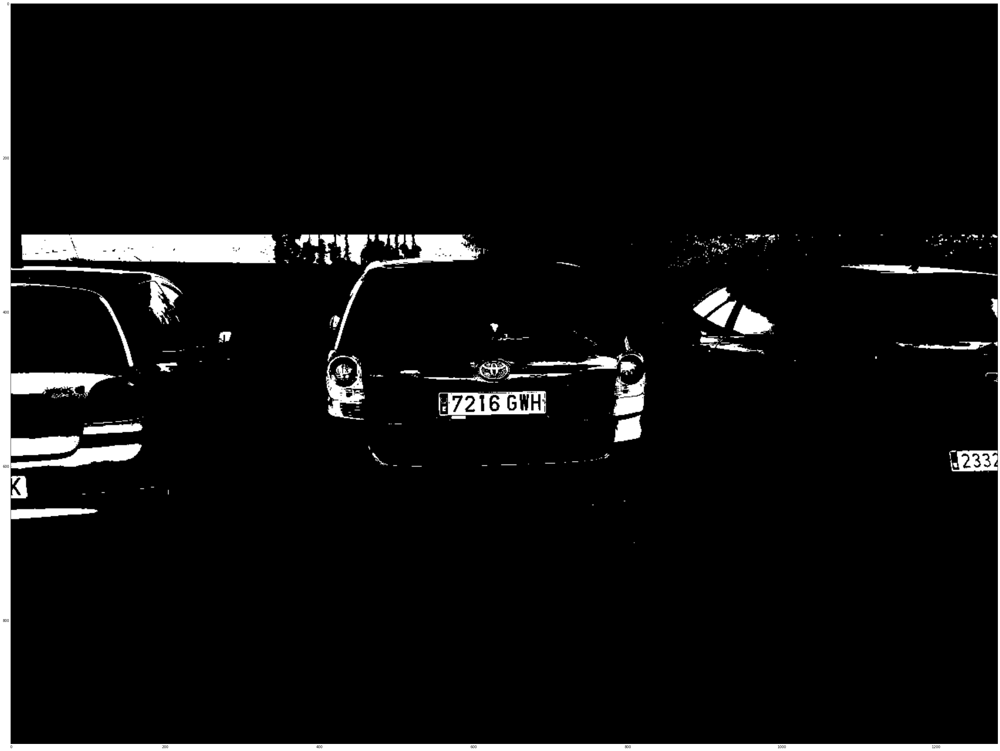

In [68]:
ret,thresh1 = cv2.threshold(masked_img,150,255,cv2.THRESH_BINARY)
plt.imshow(thresh1, cmap='gray')
plt.show()

## Otsu’s Binarization

Otsu's algorithm automatically detects the best level to calculate the threshold

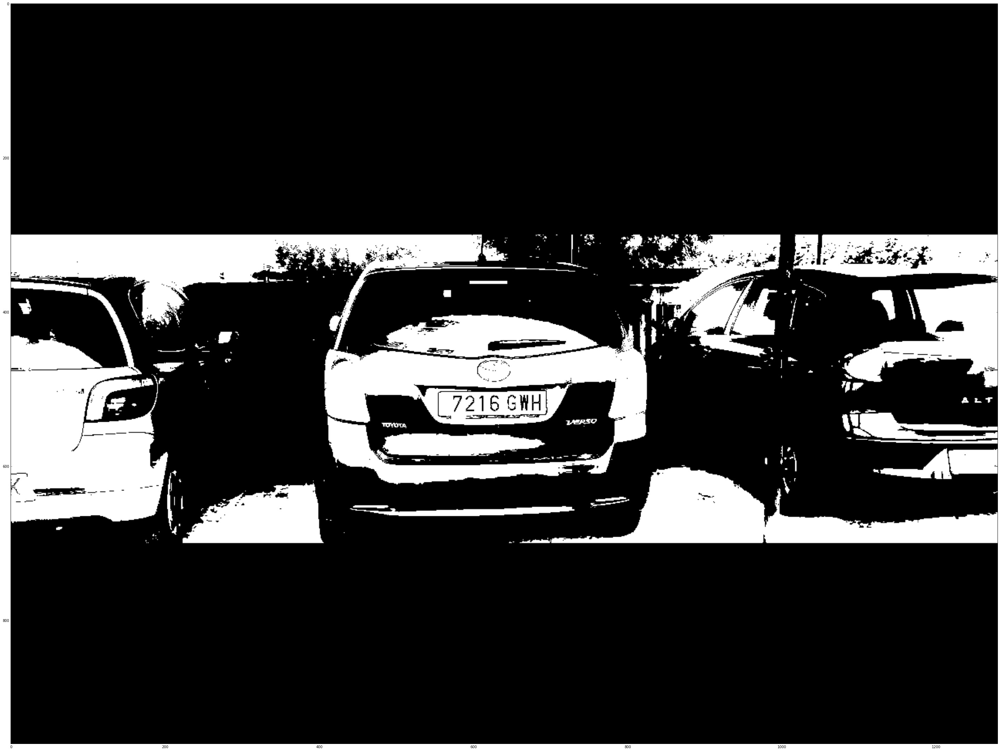

In [69]:
ret2,th2 = cv2.threshold(masked_img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(th2, cmap='gray')
plt.show()

# Ahora con vídeo xdxdxd

In [153]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import pytesseract
import argparse
import os
cap = cv2.VideoCapture('matricula4.mp4')

In [112]:
while(cap.isOpened()):
    ret, frame = cap.read()
    
    
    if cv2.waitKey(10) & 0xFF == ord('q') or not ret:
        break

    else:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        cv2.imshow('frame', gray)
        
cap.release()
cv2.destroyAllWindows()

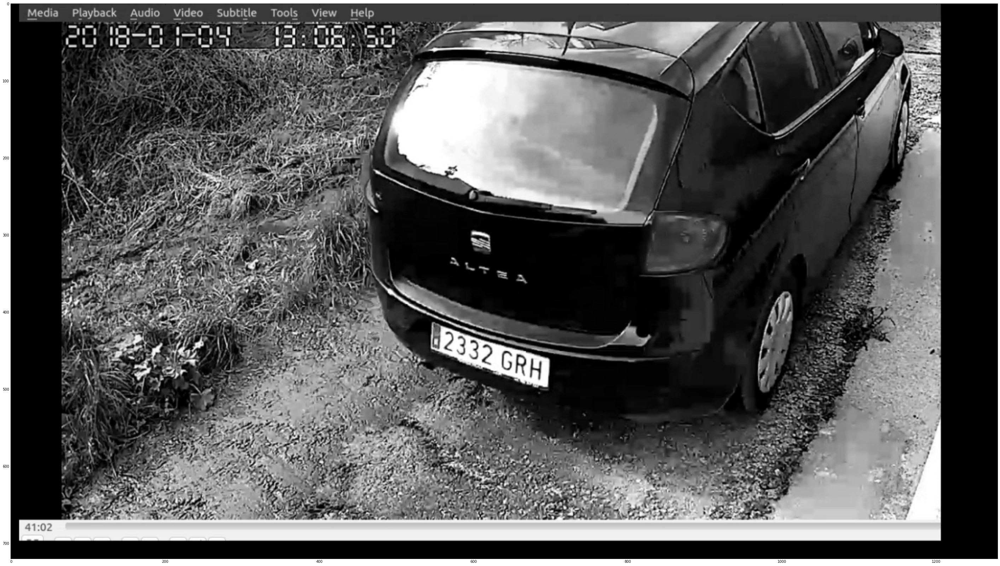

In [113]:
plt.imshow(gray, cmap='gray')
plt.show()

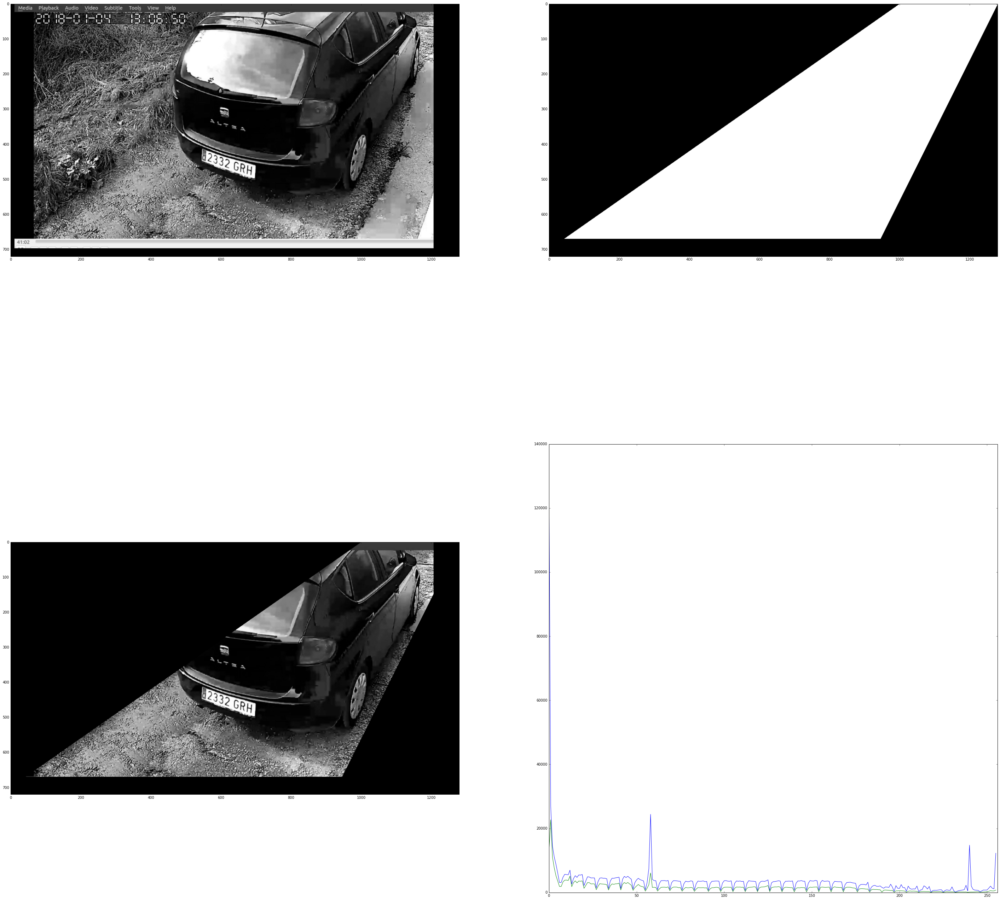

In [114]:
mask = np.ones(gray.shape[:2], np.uint8)*255

h = 0
for j in range(0,700):
    for i in range(0,1000-int(h*1.43)):
        mask[j][i] = 0
    h = h+1
h = 0    
for j in range(0,720):
    for i in range(1280-int(h*0.5),1280):
        mask[j][i] = 0
    h=h+1
    
mask[670:720, :] = 0
# Apply mask
masked_img = cv2.bitwise_and(gray,gray,mask = mask)
# Obtain histogram
hist_full = cv2.calcHist([gray],[0],None,[256],[0,256])
hist_mask = cv2.calcHist([gray],[0],mask,[256],[0,256])

plt.subplot(221), plt.imshow(gray, 'gray')
plt.subplot(222), plt.imshow(mask,'gray')
plt.subplot(223), plt.imshow(masked_img, 'gray')
plt.subplot(224), plt.plot(hist_full), plt.plot(hist_mask)
# Para recortar el histograma en 256
plt.xlim([0,256])

plt.show()

# Lookup Table

Create the Lut table as y = x³/255²

In [117]:
lut = np.zeros(256,np.uint8)
for i in range(0,256):
    lut[i] = (i**4)/(255**3)

Modify masked image with the Lookup table

In [118]:
lut_img = gray.copy()
cv2.LUT(masked_img,lut,lut_img)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

## Averaging

This is done by convolving image with a normalized box filter. It simply takes the average of all the pixels under kernel area and replace the central element. This is done by the function cv2.blur() or cv2.boxFilter(). Check the docs for more details about the kernel. We should specify the width and height of kernel. A 3x3 normalized box filter would look like below:

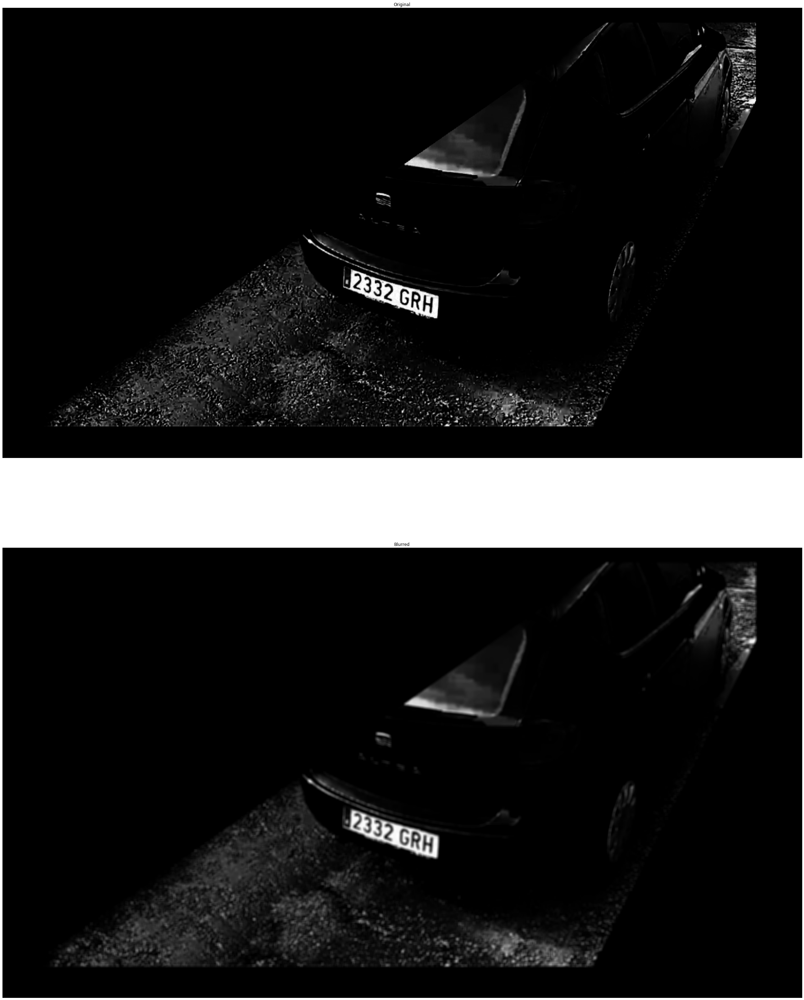

In [119]:
import matplotlib.pylab as pylab
pylab.rcParams['figure.figsize'] = 50, 50  # that's default image size for this interactive session

blur_avg = cv2.blur(lut_img,(5,5))

plt.subplot(211),plt.imshow(lut_img, 'gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])

plt.subplot(212),plt.imshow(blur_avg, 'gray'),plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

## Gaussian Blurring

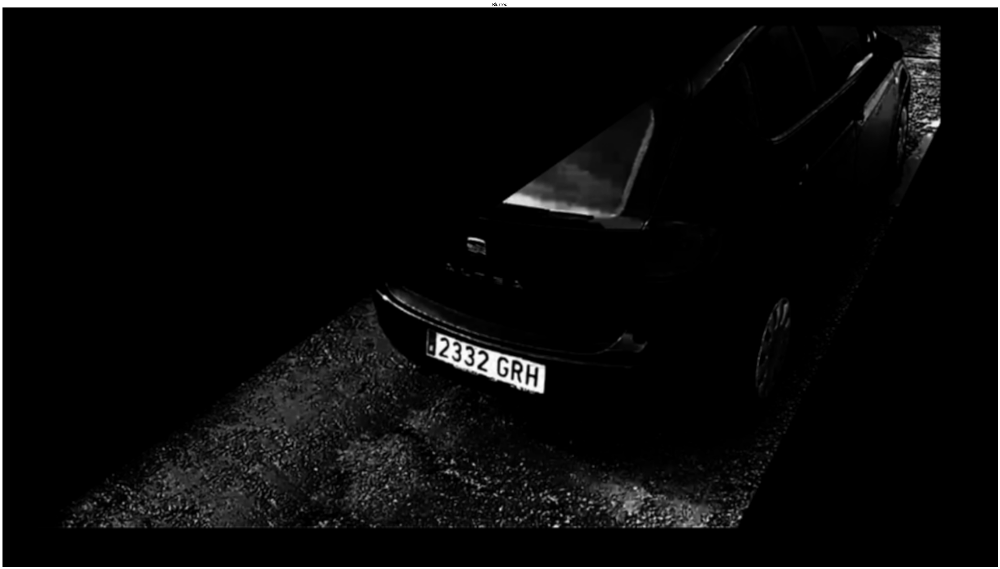

In [120]:
blur_gauss = cv2.GaussianBlur(lut_img,(3,3),10,10)

plt.plot(212),plt.imshow(blur_gauss, 'gray'),plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

# Threshold

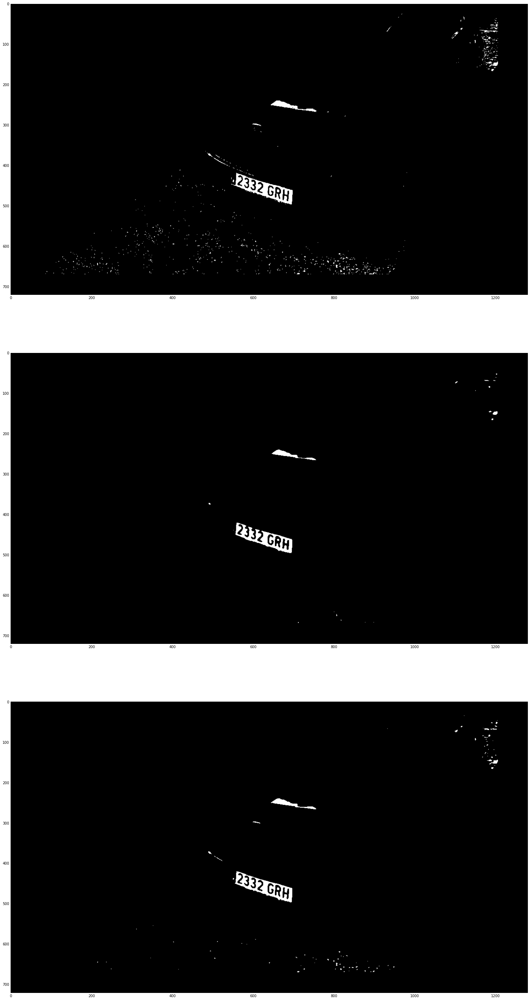

In [121]:
ret,thresh = cv2.threshold(lut_img,150,255,cv2.THRESH_BINARY)
plt.subplot(311),plt.imshow(thresh, cmap='gray')
ret,threshavg = cv2.threshold(blur_avg,150,255,cv2.THRESH_BINARY)
plt.subplot(312),plt.imshow(threshavg, cmap='gray')
ret,thresgauss = cv2.threshold(blur_gauss,150,255,cv2.THRESH_BINARY)
plt.subplot(313),plt.imshow(thresgauss, cmap='gray')
plt.show()

# Erosion

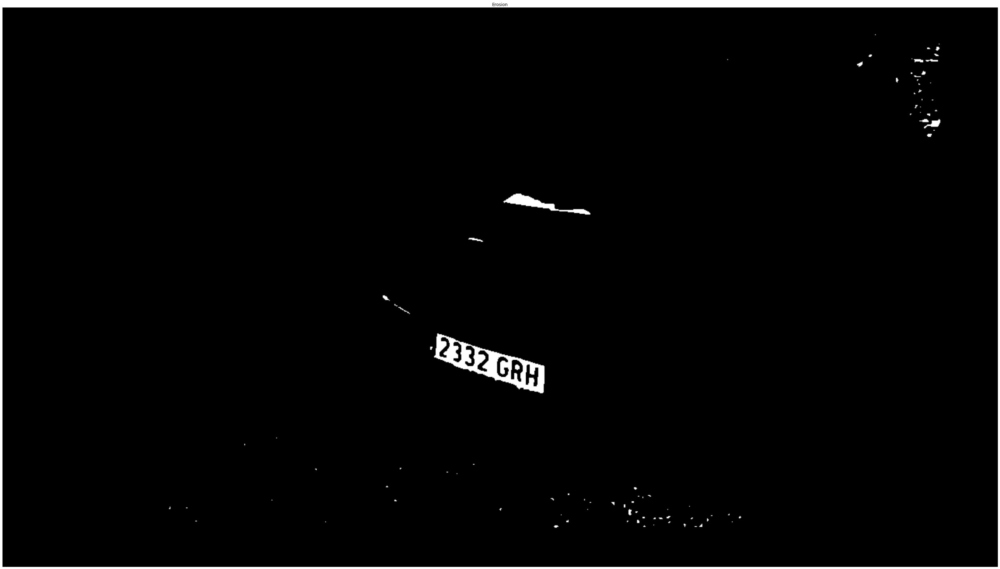

In [132]:
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresgauss, cv2.MORPH_CLOSE, kernel)
#opening = cv2.dilate(threshavg, kernel,1)
plt.plot(212),plt.imshow(opening, 'gray'),plt.title('Erosion')
plt.xticks([]), plt.yticks([])
plt.show()

# Find rectangle in the image

## Find contours

 Python: cv2.findContours(image, mode, method[, contours[, hierarchy[, offset]]]) → contours, hierarchy
 
 mode: CV_RETR_EXTERNAL retrieves only the extreme outer contours. It sets hierarchy[i][2]=hierarchy[i][3]=-1 for all the contours. Porque no nos interesa lo que hay dentro de los rectángulos, solo el rectángulo en sí
 
 method: CV_CHAIN_APPROX_SIMPLE compresses horizontal, vertical, and diagonal segments and leaves only their end points. For example, an up-right rectangular contour is encoded with 4 points. Porque más adelante necesitaremos proporcionar a las funciones un array de puntos, no líneas

In [123]:
_, contours, _= cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
_, contours_avg, _= cv2.findContours(threshavg.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
_, contours_opening, _= cv2.findContours(opening.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
_, contours_gauss, _= cv2.findContours(thresgauss.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


## Find rotated rectangle

sorting our contours, from largest to smallest, by calculating the area of the contour using cv2.contourArea. We now have only the 10 largest contours. 

In [124]:
cnts = sorted(contours, key = cv2.contourArea, reverse = True)[:10]
cnts_avg = sorted(contours_avg, key = cv2.contourArea, reverse = True)[:10]
cnts_opening = sorted(contours_opening, key = cv2.contourArea, reverse = True)[:10]
cnts_gauss = sorted(contours_gauss, key = cv2.contourArea, reverse = True)[:10]

Here, bounding rectangle is drawn with minimum area, so it considers the rotation also. The function used is cv2.minAreaRect(). It returns a Box2D structure which contains following detals - ( center (x,y), (width, height), angle of rotation ). But to draw this rectangle, we need 4 corners of the rectangle. It is obtained by the function cv2.boxPoints()

With avg

In [125]:
# frame_aux = frame.copy()
# for cont in cnts_avg:
     
#     aux = cv2.minAreaRect(cont)

#     if (aux[1][0]<aux[1][1]):
#         width = aux[1][1]
#     else:
#         width = aux[1][0]
#     if (0 < width) & (width < 500):
#         print width
#         box_avg = cv2.boxPoints(aux)
#         box_avg = np.int0(box_avg)
#         cv2.drawContours(frame_aux,[box_avg],0,(0,0,255),2)
        
# for cont in cnts_opening:
     
#     aux = cv2.minAreaRect(cont)

#     if (aux[1][0]<aux[1][1]):
#         width = aux[1][1]
#     else:
#         width = aux[1][0]
#     if (0 < width) & (width < 500):
#         print width
#         box_avg = cv2.boxPoints(aux)
#         box_avg = np.int0(box_avg)
#         cv2.drawContours(frame_aux,[box_avg],0,(255,0,0),2)
    
    
# plt.imshow(frame_aux),plt.title('holi')
# plt.xticks([]), plt.yticks([])
# plt.show()

## Lut image

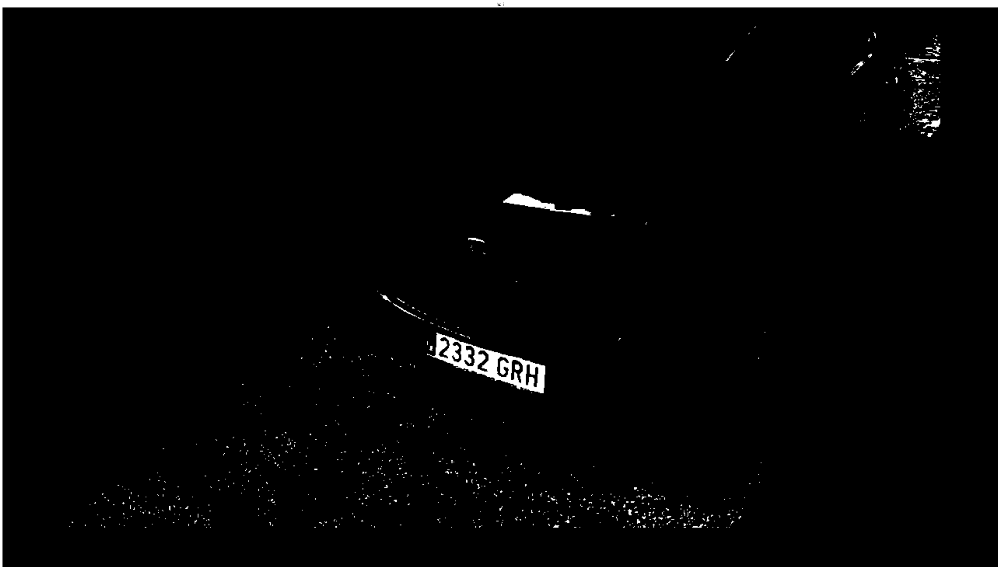

In [126]:
rect = []
#frame_aux = thresgauss.copy()
frame_aux = cv2.cvtColor(thresh.copy(),cv2.COLOR_GRAY2RGB)
for cont in cnts:
    # approximate the contour
    peri = cv2.arcLength(cont, True)
    approx = cv2.approxPolyDP(cont, 0.02 * peri, True)

    # if our approximated contour has four points, then
    # we can assume that we have found our screen
    if len(approx) == 4:
        cv2.drawContours(frame_aux,[approx],0,(0,255,0),2)
        


plt.imshow(frame_aux),plt.title('holi')
plt.xticks([]), plt.yticks([])
plt.show()

### Average

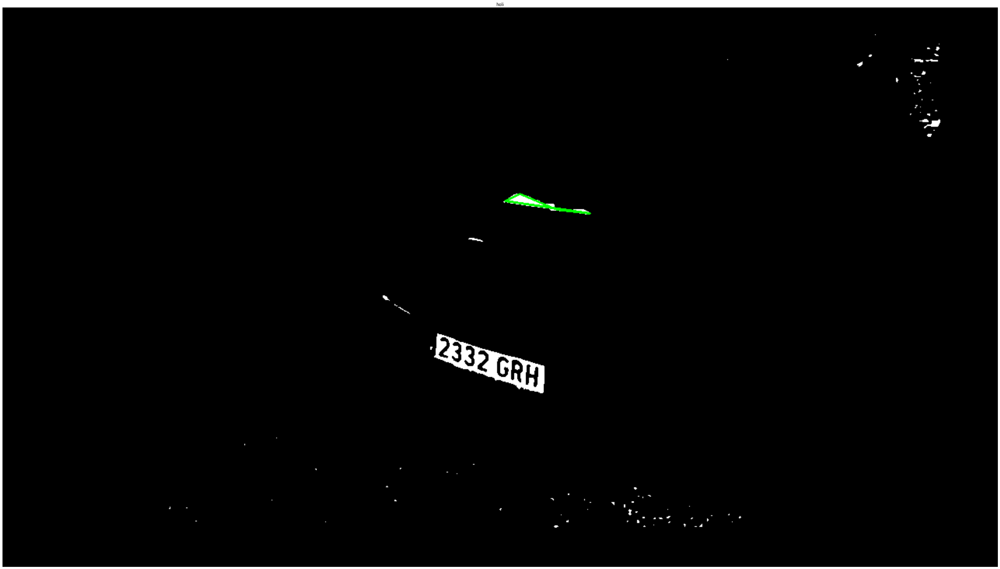

In [127]:
rect = []
#frame_aux = thresgauss.copy()
frame_aux = cv2.cvtColor(thresgauss.copy(),cv2.COLOR_GRAY2RGB)
for cont in cnts_avg:
    # approximate the contour
    peri = cv2.arcLength(cont, True)
    approx = cv2.approxPolyDP(cont, 0.02 * peri, True)

    # if our approximated contour has four points, then
    # we can assume that we have found our screen
    if len(approx) == 4:
        cv2.drawContours(frame_aux,[approx],0,(0,255,0),2)
        


plt.imshow(frame_aux),plt.title('holi')
plt.xticks([]), plt.yticks([])
plt.show()

### Opening

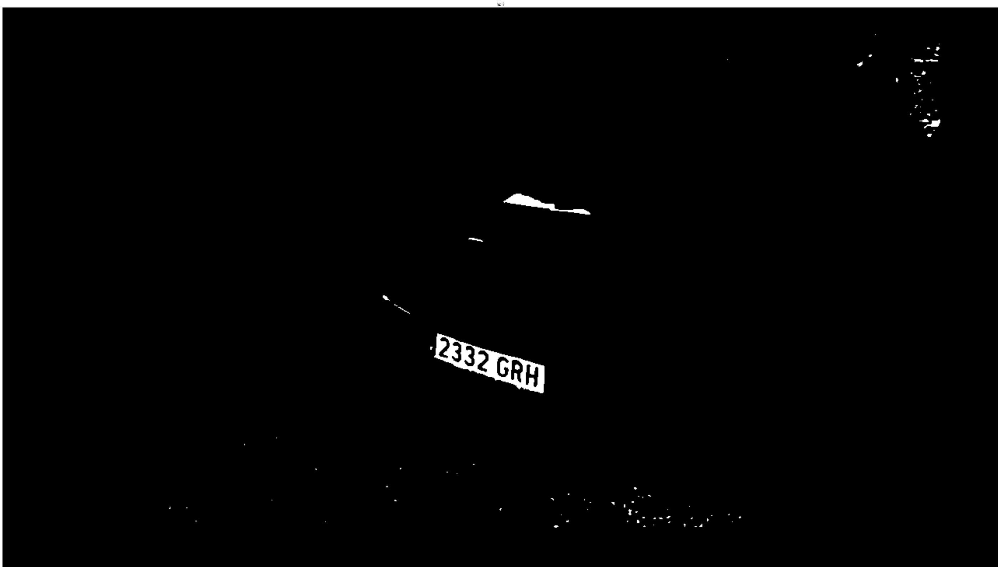

In [133]:
rect = []
#frame_aux = thresgauss.copy()
frame_aux = cv2.cvtColor(thresgauss.copy(),cv2.COLOR_GRAY2RGB)
for cont in cnts_opening:
    # approximate the contour
    peri = cv2.arcLength(cont, True)
    approx = cv2.approxPolyDP(cont, 0.02 * peri, True)

    # if our approximated contour has four points, then
    # we can assume that we have found our screen
    if len(approx) == 4:
        cv2.drawContours(frame_aux,[approx],0,(0,255,0),2)

frame_opening=frame_aux
plt.imshow(frame_aux),plt.title('holi')
plt.xticks([]), plt.yticks([])
plt.show()

### Gauss

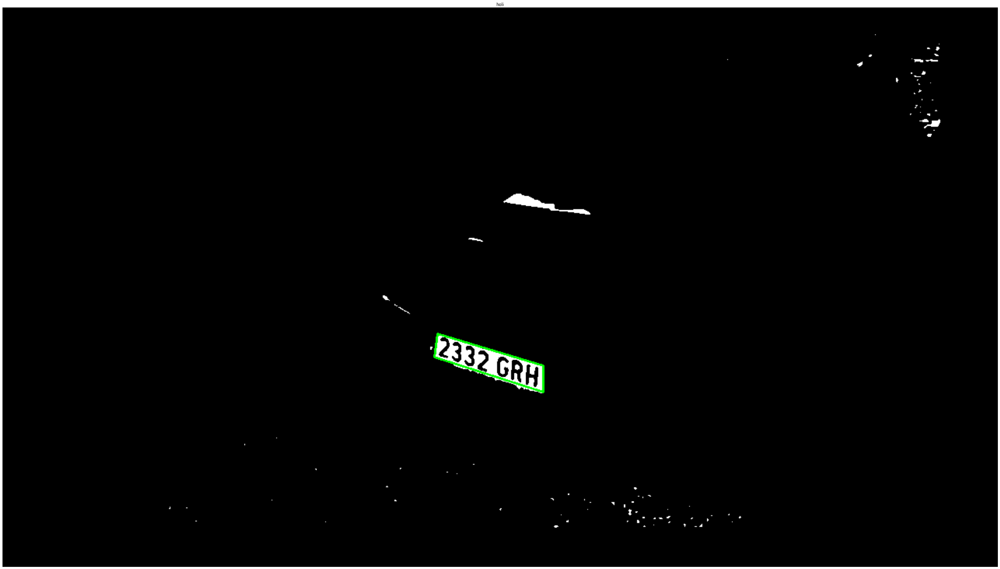

In [134]:

#frame_aux = thresgauss.copy()
frame_aux = cv2.cvtColor(thresgauss.copy(),cv2.COLOR_GRAY2RGB)
for cont in cnts_gauss:
    # approximate the contour
    peri = cv2.arcLength(cont, True)
    approx = cv2.approxPolyDP(cont, 0.02 * peri, True)

    # if our approximated contour has four points, then
    # we can assume that we have found our screen
    if len(approx) == 4:
        cv2.drawContours(frame_aux,[approx],0,(0,255,0),2)
        screenCnt = approx        
plt.imshow(frame_aux),plt.title('holi')
plt.xticks([]), plt.yticks([])
plt.show()

### Determine corner points

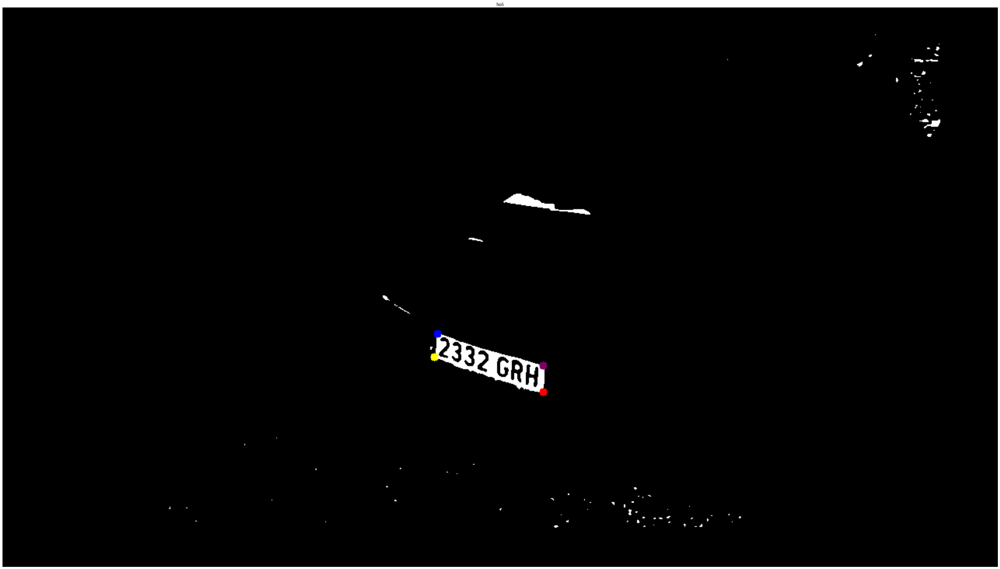

In [145]:
corners = screenCnt.reshape(4, 2)
rect = np.zeros((4, 2), dtype = "float32")
s = corners.sum(axis = 1)
#Top-left has the minimum sum
#Bottom-right has maximum sum
rect[0] = corners[np.argmin(s)]
rect[2] = corners[np.argmax(s)]
#Top-right has the minimum difference
#Bottom-left has the maximum difference
diff = np.diff(corners, axis = 1)
rect[1] = corners[np.argmin(diff)]
rect[3] = corners[np.argmax(diff)]
cv2.circle(frame_opening,(rect[0][0],rect[0][1]), 5, (0,0,255), -1)
cv2.circle(frame_opening,(rect[1][0],rect[1][1]), 5, (127,0,100), -1)
cv2.circle(frame_opening,(rect[2][0],rect[2][1]), 5, (255,0,0), -1)
cv2.circle(frame_opening,(rect[3][0],rect[3][1]), 5, (255,255,0), -1)
plt.imshow(frame_opening),plt.title('holi')
plt.xticks([]), plt.yticks([])
plt.show()

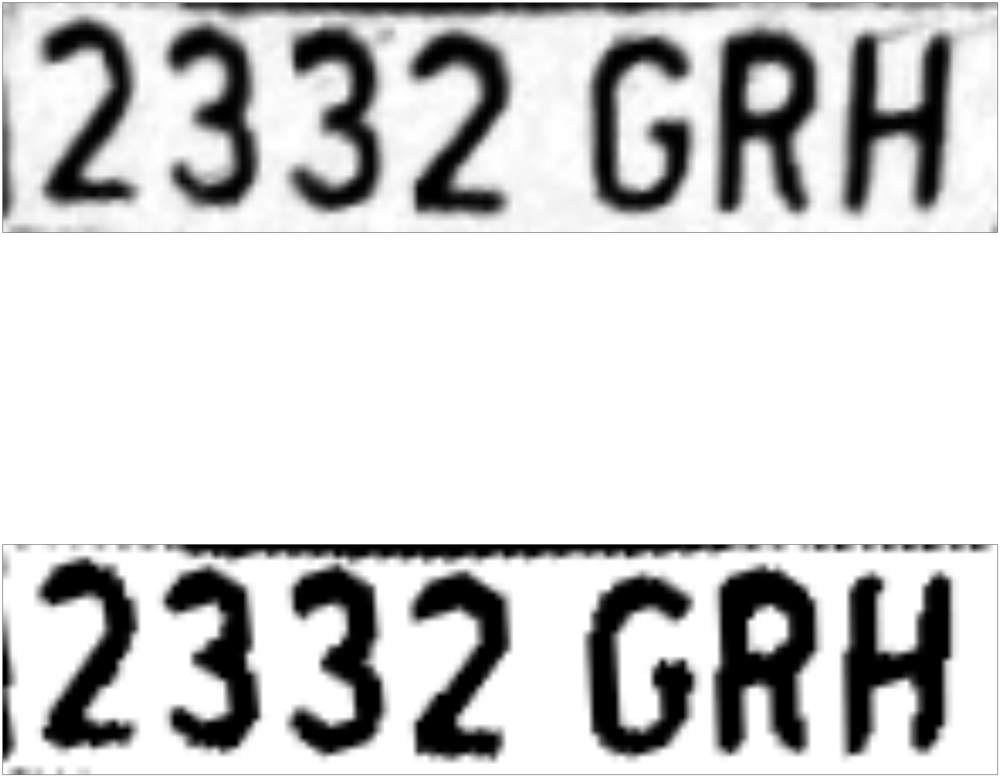

In [152]:
import imutils
#We want our new image height to be newHeight pixels.
#Compute the ratio of the old height to the new height
newHeight = 200

#ratio = frame_opening.shape[0] / newHeight
#rect *= ratio

orig_lut = lut_img.copy()
orig_gauss = thresgauss.copy()
#image = imutils.resize(image, height = 200)

# now that we have our rectangle of points, let's compute
# the width of our new image
(tl, tr, br, bl) = rect
widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
 
# ...and now for the height of our new image
heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
 
# take the maximum of the width and height values to reach
# our final dimensions
maxWidth = max(int(widthA), int(widthB))
maxHeight = max(int(heightA), int(heightB))
 
# construct our destination points which will be used to
# map the screen to a top-down view
dst = np.array([
[0, 0],
[maxWidth - 1, 0],
[maxWidth - 1, maxHeight - 1],
[0, maxHeight - 1]], dtype = "float32")
 
# calculate the perspective transform matrix and warp
# the perspective to grab the screen
M = cv2.getPerspectiveTransform(rect, dst)

warp_lut = cv2.warpPerspective(orig_lut, M, (maxWidth, maxHeight))
warp_gauss = cv2.warpPerspective(orig_gauss, M, (maxWidth, maxHeight))
plt.subplot(211),plt.imshow(warp_lut,'gray')
plt.xticks([]), plt.yticks([])
plt.subplot(212),plt.imshow(warp_gauss,'gray')
plt.xticks([]), plt.yticks([])
plt.show()